In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [2]:
import os, sys
os.getcwd()
rpath = os.path.abspath('../')
if rpath not in sys.path:
    sys.path.insert(0,rpath)
#sys.path.insert(0,os.path.abspath('../'))

In [3]:
# Construct the file path
file_path = os.path.join(rpath, 'data', 'sierraleone-bumbuna.csv')

# Read the CSV file into a DataFrame
data = pd.read_csv(file_path)
data.head()

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-10-30 00:01,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.1,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
1,2021-10-30 00:02,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
2,2021-10-30 00:03,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
3,2021-10-30 00:04,-0.7,0.0,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.1,22.3,22.6,NaN
4,2021-10-30 00:05,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN


In [4]:
# Standardize data formats
data['Timestamp'] = (pd.to_datetime(data['Timestamp'])) #.dt.date
data.head()

,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-10-30 00:01:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.1,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
1,2021-10-30 00:02:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
2,2021-10-30 00:03:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
3,2021-10-30 00:04:00,-0.7,0.0,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.1,22.3,22.6,NaN
4,2021-10-30 00:05:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN


### **Summary Statistics Analysis**

In [5]:
data.columns

Index(['Timestamp', 'GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'Tamb', 'RH', 'WS',
       'WSgust', 'WSstdev', 'WD', 'WDstdev', 'BP', 'Cleaning', 'Precipitation',
       'TModA', 'TModB', 'Comments'],
      dtype='object')

In [6]:
print(data.shape)

(525600, 19)


In [7]:
data.set_index('Timestamp', inplace=True)
data.head()

,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
Timestamp,,,,,,,,,,,,,,,,,,
2021-10-30 00:01:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.1,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
2021-10-30 00:02:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
2021-10-30 00:03:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.2,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN
2021-10-30 00:04:00,-0.7,0.0,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.1,22.3,22.6,NaN
2021-10-30 00:05:00,-0.7,-0.1,-0.8,0.0,0.0,21.9,99.3,0.0,0.0,0.0,0.0,0.0,1002,0,0.0,22.3,22.6,NaN


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 525600 entries, 2021-10-30 00:01:00 to 2022-10-30 00:00:00
Data columns (total 18 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   GHI            525600 non-null  float64
 1   DNI            525600 non-null  float64
 2   DHI            525600 non-null  float64
 3   ModA           525600 non-null  float64
 4   ModB           525600 non-null  float64
 5   Tamb           525600 non-null  float64
 6   RH             525600 non-null  float64
 7   WS             525600 non-null  float64
 8   WSgust         525600 non-null  float64
 9   WSstdev        525600 non-null  float64
 10  WD             525600 non-null  float64
 11  WDstdev        525600 non-null  float64
 12  BP             525600 non-null  int64  
 13  Cleaning       525600 non-null  int64  
 14  Precipitation  525600 non-null  float64
 15  TModA          525600 non-null  float64
 16  TModB          525600 non-null  float64


In [9]:
data.describe()

,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
count,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,0.0
mean,201.957515,116.376337,113.720571,206.643095,198.114691,26.319394,79.448857,1.146113,1.691606,0.363823,133.044668,7.172220,999.876469,0.000967,0.004806,32.504263,32.593091,NaN
std,298.495150,218.652659,158.946032,300.896893,288.889073,4.398605,20.520775,1.239248,1.617053,0.295000,114.284792,7.535093,2.104419,0.031074,0.047556,12.434899,12.009161,NaN
min,-19.500000,-7.800000,-17.900000,0.000000,0.000000,12.300000,9.900000,0.000000,0.000000,0.000000,0.000000,0.000000,993.000000,0.000000,0.000000,10.700000,11.100000,NaN
25%,-2.800000,-0.300000,-3.800000,0.000000,0.000000,23.100000,68.700000,0.000000,0.000000,0.000000,0.000000,0.000000,999.000000,0.000000,0.000000,23.500000,23.800000,NaN
50%,0.300000,-0.100000,-0.100000,3.600000,3.400000,25.300000,85.400000,0.800000,1.600000,0.400000,161.500000,6.200000,1000.000000,0.000000,0.000000,26.600000,26.900000,NaN
75%,362.400000,107.000000,224.700000,359.500000,345.400000,29.400000,96.700000,2.000000,2.600000,0.600000,234.100000,12.000000,1001.000000,0.000000,0.000000,40.900000,41.300000,NaN
max,1499.000000,946.000000,892.000000,1507.000000,1473.000000,39.900000,100.000000,19.200000,23.900000,4.100000,360.000000,98.400000,1006.000000,1.000000,2.400000,72.800000,70.400000,NaN


### **Data Quality Check**

In [10]:
# Check for missing values in specific columns
missing_values = data.isnull().sum()
print(missing_values)

GHI                   0
DNI                   0
DHI                   0
ModA                  0
ModB                  0
Tamb                  0
RH                    0
WS                    0
WSgust                0
WSstdev               0
WD                    0
WDstdev               0
BP                    0
Cleaning              0
Precipitation         0
TModA                 0
TModB                 0
Comments         525600
dtype: int64


In [11]:
# 1. Remove columns that are entirely null
data = data.dropna(axis=1, how='all')

In [12]:
# Check for missing values in specific columns
missing_values = data.isnull().sum()
print(missing_values)

GHI              0
DNI              0
DHI              0
ModA             0
ModB             0
Tamb             0
RH               0
WS               0
WSgust           0
WSstdev          0
WD               0
WDstdev          0
BP               0
Cleaning         0
Precipitation    0
TModA            0
TModB            0
dtype: int64


In [13]:
# main.py
from scripts.incorrect_entries import check_incorrect_entries, replace_negative_with_zero
incorrect_entries = check_incorrect_entries(data)
print(incorrect_entries)

{'GHI': 261135, 'DNI': 266352, 'DHI': 263128}


In [14]:
clean_data = replace_negative_with_zero(data)
incorrect_entries = check_incorrect_entries(clean_data)
print(incorrect_entries)

{}


### **Plot Time Series Data**

<Figure size 800x300 with 0 Axes>

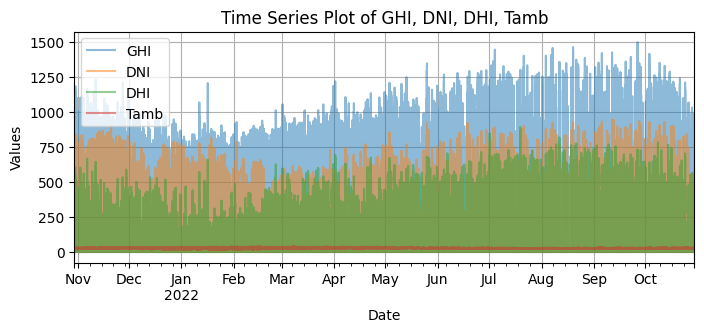

In [15]:
from scripts.plot_timeseries_graph import plot_time_series,plot_hourly_radiation,plot_daily_radiation,plot_weeky_radiation,plot_Monthly_radiation

# Example DataFrame creation
# data = pd.DataFrame({...})
columns_to_plot = ['GHI', 'DNI', 'DHI','Tamb' ]
plot_time_series(clean_data, columns_to_plot)


C:\Users\AII\AppData\Local\Temp\ipykernel_13020\169634108.py:2: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  sierraleonedata_hourly = clean_data.resample('H').mean()


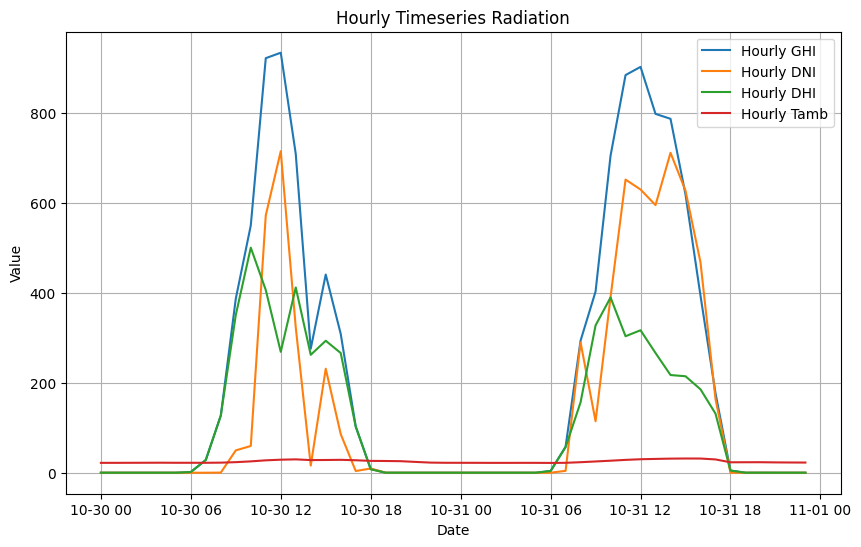

In [16]:
# Example DataFrame creation
sierraleonedata_hourly = clean_data.resample('H').mean()
columns_to_plot = ['GHI', 'DNI', 'DHI','Tamb' ]
plot_hourly_radiation(sierraleonedata_hourly, columns_to_plot,start_index=0, end_index=48)

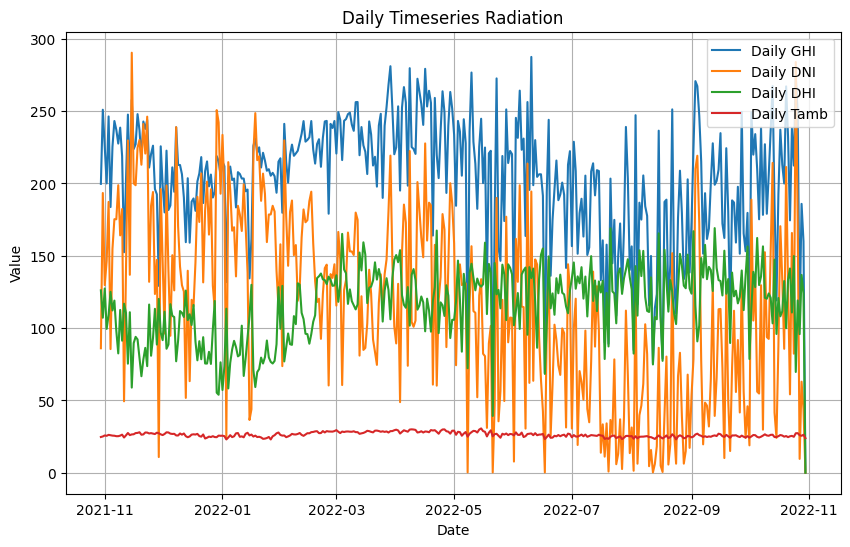

In [17]:
# Example DataFrame creation
daily_data = clean_data.resample('D').mean()
columns_to_plot = ['GHI', 'DNI', 'DHI','Tamb' ]
plot_daily_radiation(daily_data, columns_to_plot)

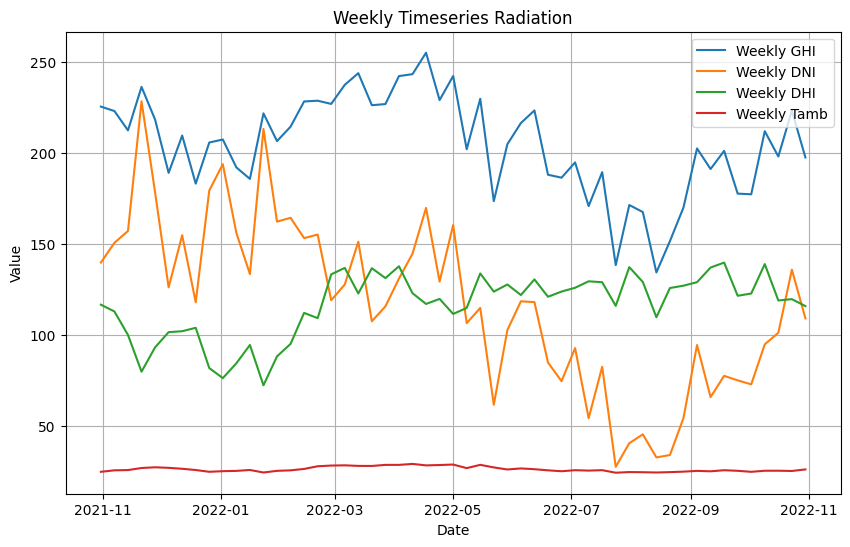

In [18]:
# Example DataFrame creation
sierraleonedata_weekly = clean_data.resample('W').mean()
columns_to_plot = ['GHI', 'DNI', 'DHI','Tamb']
plot_weeky_radiation(sierraleonedata_weekly, columns_to_plot)


C:\Users\AII\AppData\Local\Temp\ipykernel_13020\3633403582.py:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_data = clean_data.resample('M').mean()


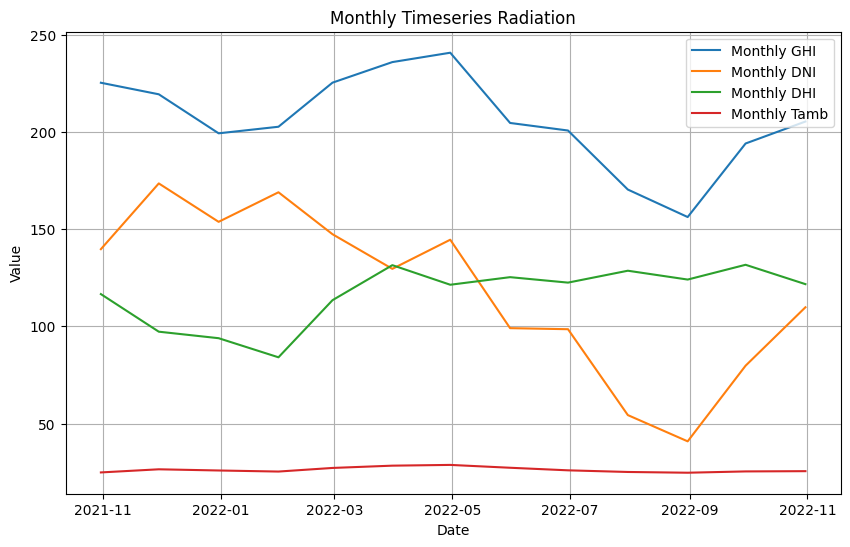

In [19]:
#Example DataFrame creation
monthly_data = clean_data.resample('M').mean()
columns_to_plot = ['GHI', 'DNI', 'DHI','Tamb']
plot_Monthly_radiation(monthly_data, columns_to_plot)

* **Evaluating the impact of cleaning module on the sensor readings (ModA, ModB) over time**

<Figure size 800x300 with 0 Axes>

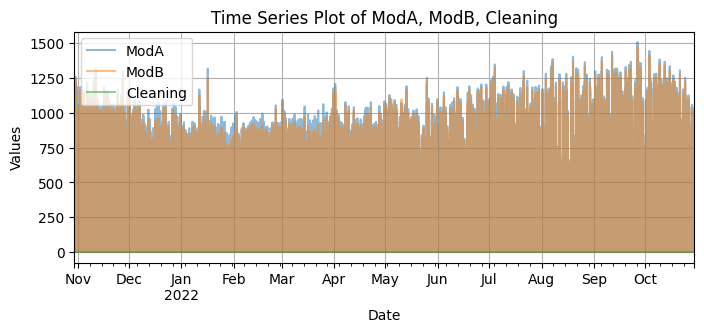

In [20]:
columns_to_plot = ['ModA', 'ModB', 'Cleaning']
plot_time_series(clean_data, columns_to_plot)

<Figure size 800x300 with 0 Axes>

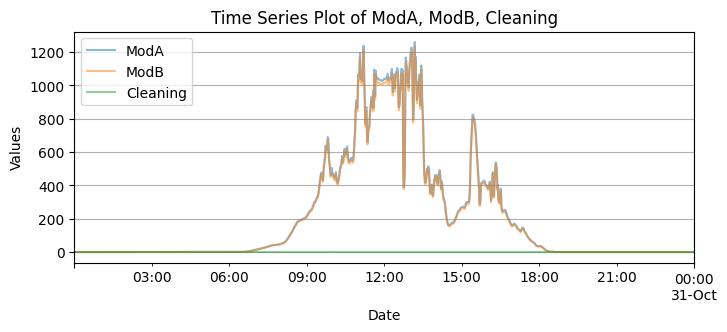

In [21]:
columns_to_plot = ['ModA', 'ModB', 'Cleaning']
plot_time_series(clean_data[:1440], columns_to_plot)

C:\Users\AII\AppData\Local\Temp\ipykernel_13020\1044767265.py:1: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  sierraleonedata_hourly = clean_data.resample('H').mean()


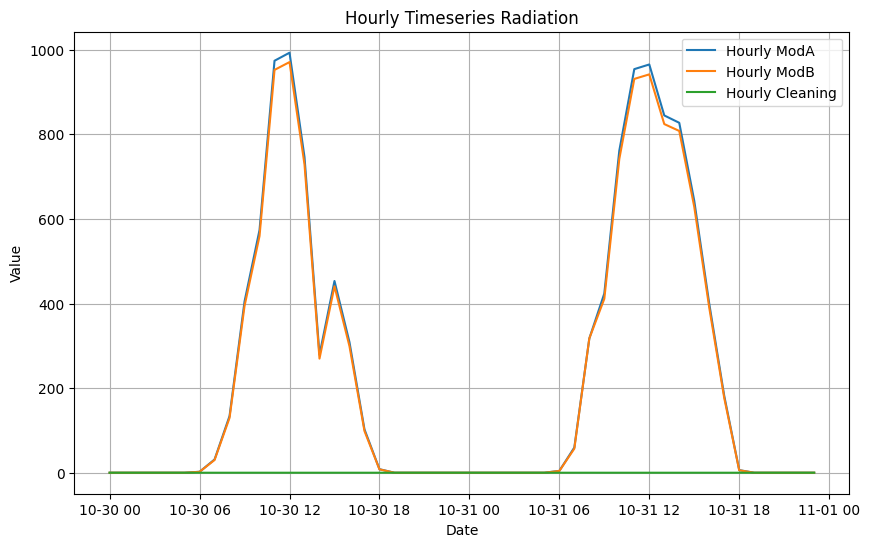

In [22]:
sierraleonedata_hourly = clean_data.resample('H').mean()
columns_to_plot = ['ModA', 'ModB', 'Cleaning']
plot_hourly_radiation(sierraleonedata_hourly, columns_to_plot,start_index=0, end_index=48)

C:\Users\AII\AppData\Local\Temp\ipykernel_13020\1582243418.py:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  sierraleonedata_hourly = clean_data.resample('M').mean()


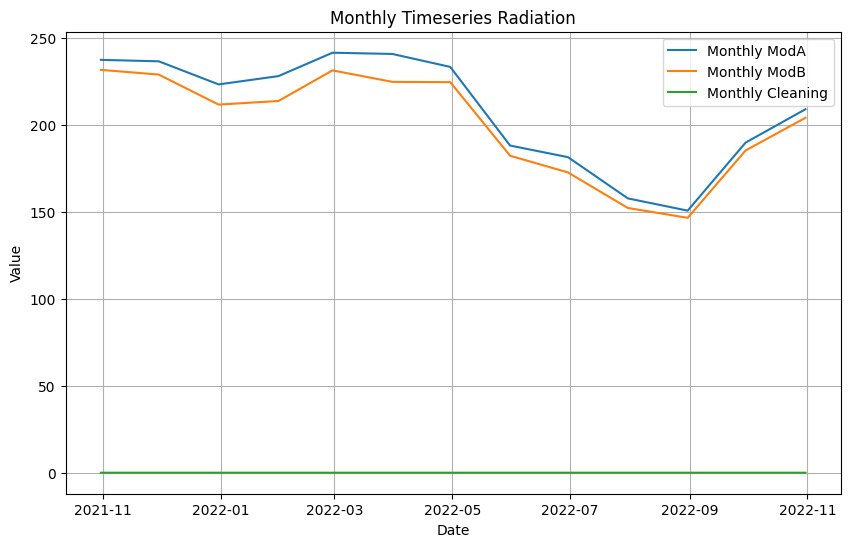

In [46]:
sierraleonedata_hourly = clean_data.resample('M').mean()
columns_to_plot = ['ModA', 'ModB', 'Cleaning']
plot_Monthly_radiation(sierraleonedata_hourly, columns_to_plot)

### **Correlation Analysis**

**Heatmap** 
* The heatmap provides a visual summary of correlations between variables, making it easy to identify strong positive or negative correlations.
* Look for strong correlations (values close to 1 or -1) between the solar radiation components and temperature measures. Positive correlations are indicated by warm colors, while negative correlations are shown by cool colors.

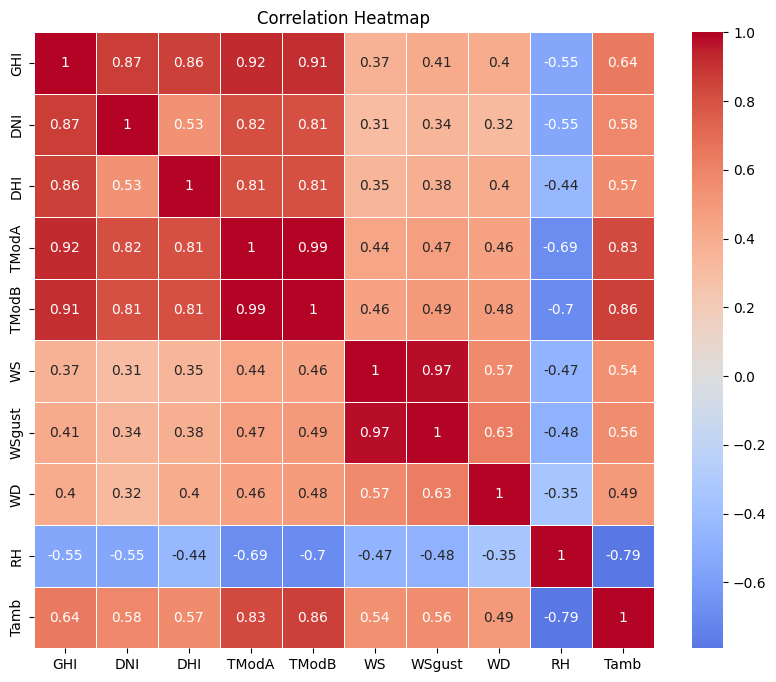

In [47]:
from scripts.correlation_analysis import plot_correlation_heatmap
columns_of_interest = ['GHI', 'DNI', 'DHI', 'TModA', 'TModB', 'WS', 'WSgust', 'WD','RH', 'Tamb']

corr_matrix = plot_correlation_heatmap(clean_data, columns_of_interest)

**Pair Plot** 
* The pair plot shows scatter plots for each pair of variables and histograms for individual variables. This is useful for identifying relationships and distributions.
* Investigate the scatter plots and histograms to observe the relationships between solar radiation components and temperature. Pay attention to linear relationships, clusters, and any outliers.

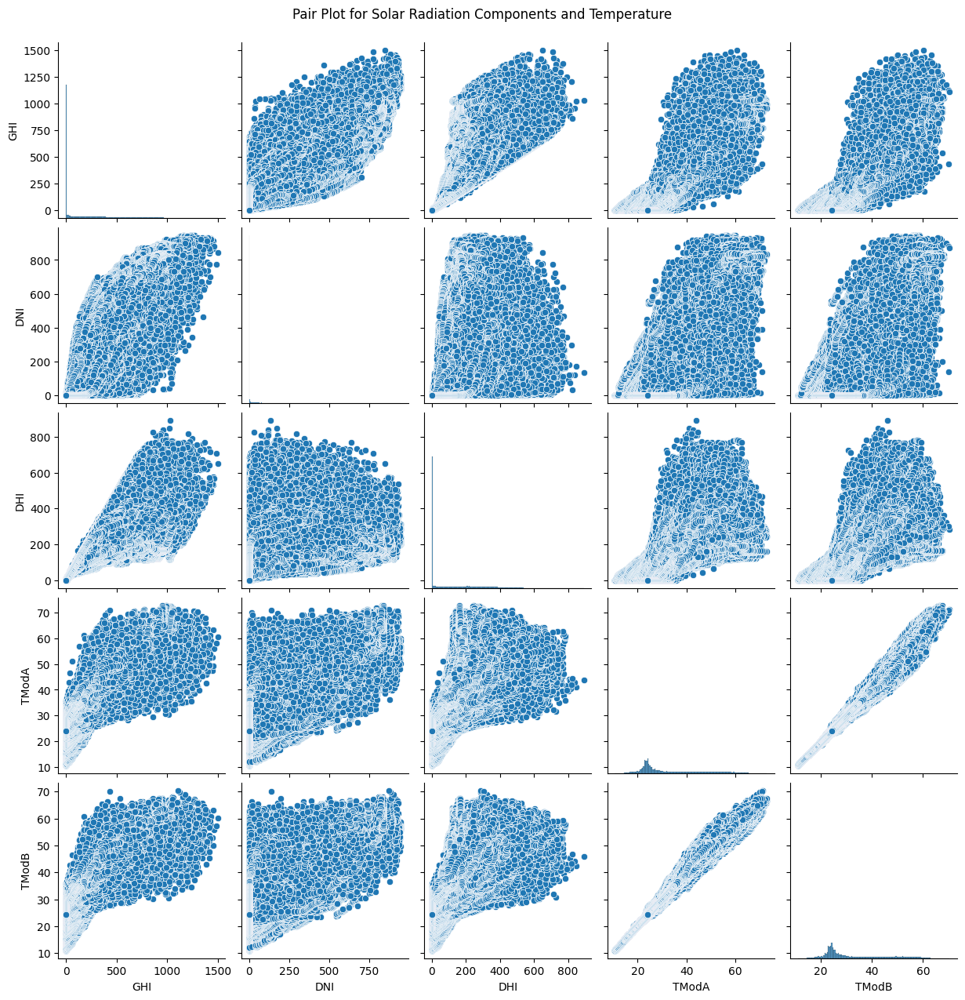

In [24]:
# Pair plot for solar radiation components and temperature
sns.pairplot(clean_data[['GHI', 'DNI', 'DHI', 'TModA', 'TModB']])
plt.suptitle('Pair Plot for Solar Radiation Components and Temperature', y=1.02)
plt.show()

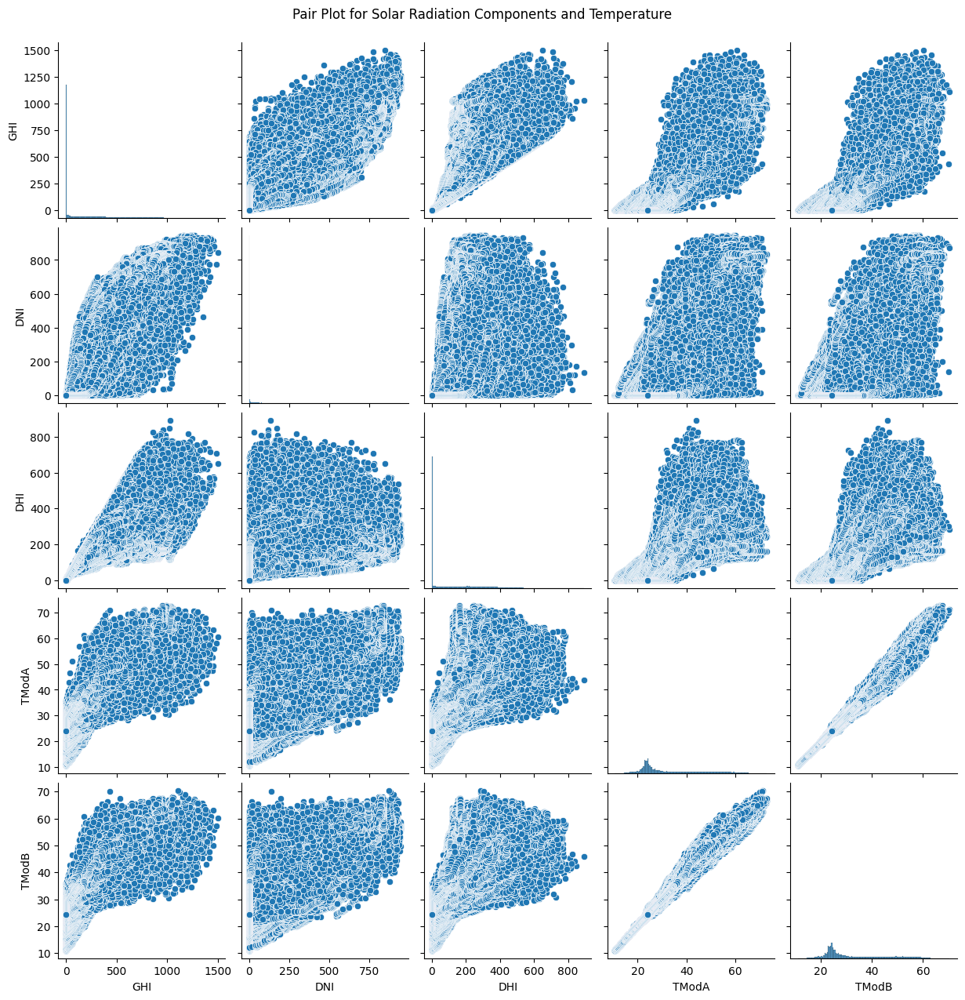

In [25]:
from scripts.correlation_analysis import plot_pairplot
columns_of_interest = ['GHI', 'DNI', 'DHI', 'TModA', 'TModB']
plot_pairplot(clean_data, columns_of_interest, title='Pair Plot for Solar Radiation Components and Temperature')

**Scatter Matrix** 
* The scatter matrix provides a grid of scatter plots for each combination of wind conditions and solar irradiance. This helps in exploring potential correlations and dependencies between these variables.
* Analyze the scatter plots to explore the relationship between wind conditions (WS, WSgust, WD) and solar irradiance (GHI, DNI, DHI). Look for patterns or trends that might indicate how wind conditions influence solar irradiance.

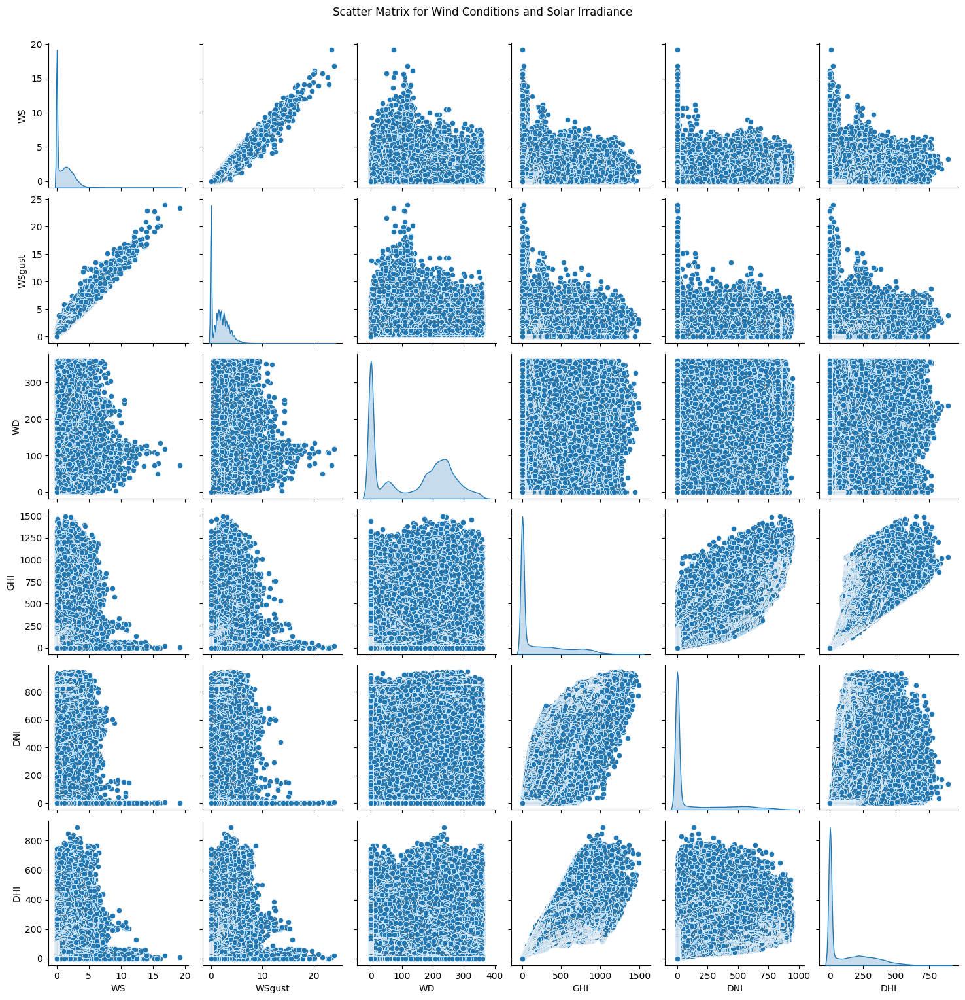

In [26]:
from scripts.correlation_analysis import plot_scatter_matrix
columns_of_interest = ['WS', 'WSgust', 'WD', 'GHI', 'DNI', 'DHI']
plot_scatter_matrix(clean_data, columns_of_interest, title='Scatter Matrix for Wind Conditions and Solar Irradiance')

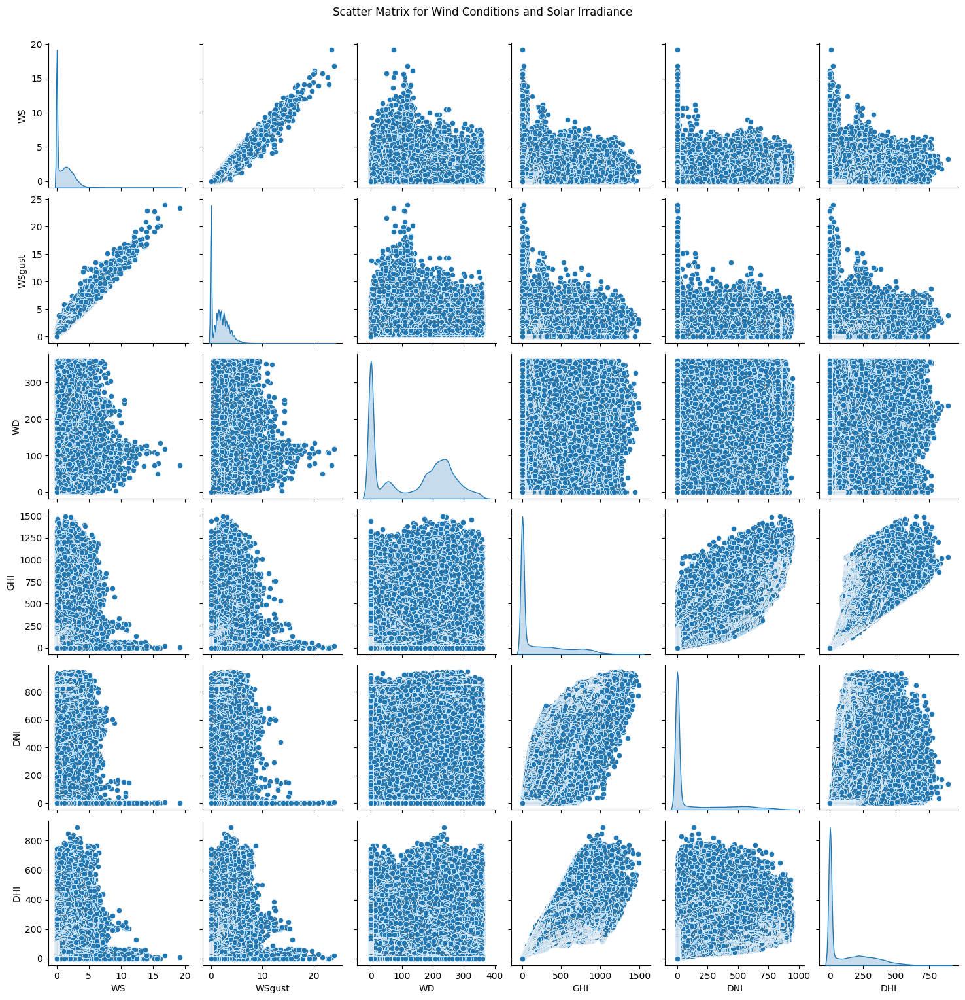

In [27]:
# Scatter matrix for wind conditions (WS, WSgust, WD) and solar irradiance (GHI, DNI, DHI)
sns.pairplot(clean_data[['WS', 'WSgust', 'WD', 'GHI', 'DNI', 'DHI']], diag_kind='kde')
plt.suptitle('Scatter Matrix for Wind Conditions and Solar Irradiance', y=1.02)
plt.show()

### **Wind Analysis**

* **Scatter Polar Plot**: This plot allows you to observe how wind speeds vary with direction. High wind speeds will be indicated by points farther from the center and also any predominant wind directions where higher speeds are frequent.

* Scatter Polar Plot: This plot allows you to observe how wind speeds vary with direction. High wind speeds will be indicated by points farther from the center. You can also identify any predominant wind directions where higher speeds are frequent.

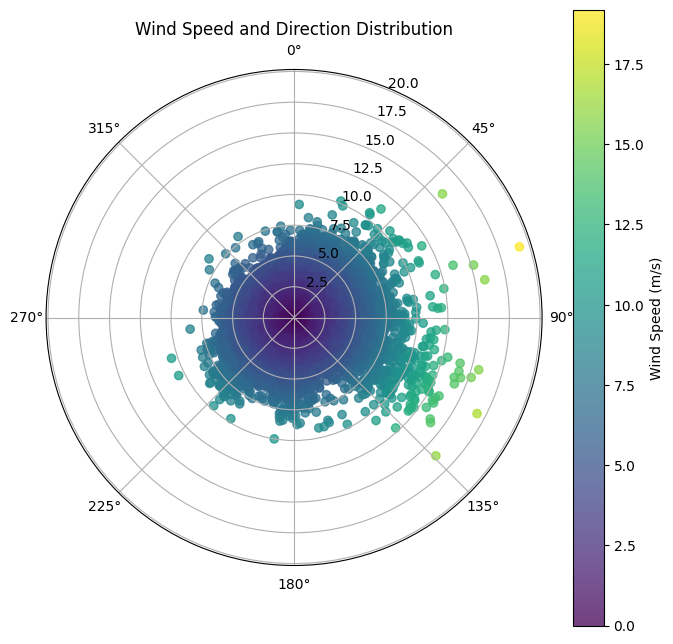

In [28]:
from scripts.windspeed_analysis import plot_wind_speed_direction, plot_wind_rose
plot_wind_speed_direction(clean_data, speed_col='WS', direction_col='WD')

* **Wind Rose:** The wind rose reveals the most common wind directions and the range of wind speeds associated with those directions. It can help to identify trends such as prevailing winds or significant wind events that affect your study area.

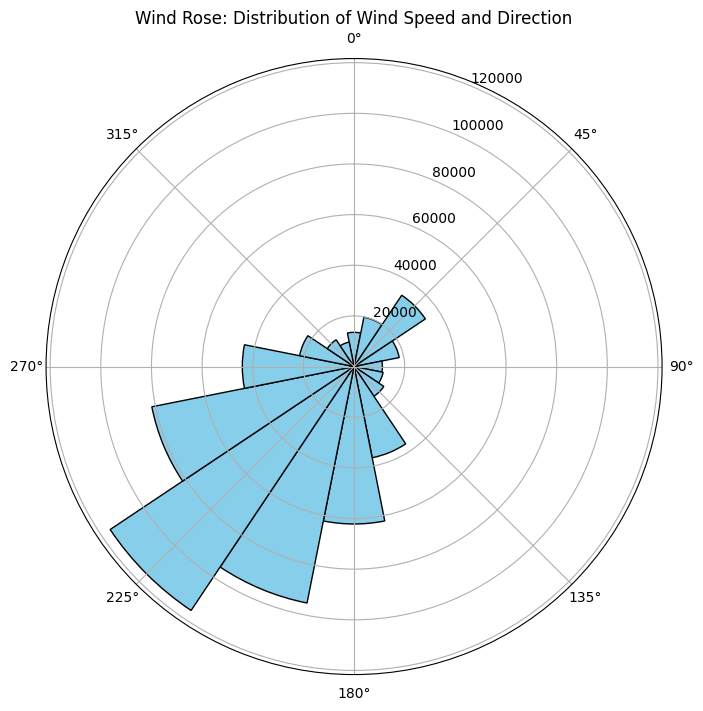

In [29]:
plot_wind_rose(clean_data, speed_col='WS', direction_col='WD')

### **Temperature Analysis**
> how relative humidity (RH) might influence temperature readings and solar radiation.

* GHI (W/m²): Global Horizontal Irradiance, the total solar radiation received per square meter on a horizontal surface.
* DNI (W/m²): Direct Normal Irradiance, the amount of solar radiation received per square meter on a surface perpendicular to the rays of the sun.
* DHI (W/m²): Diffuse Horizontal Irradiance, solar radiation received per square meter on a horizontal surface that does not arrive on a direct path from the sun.

In [30]:
correlations = clean_data[['RH', 'Tamb', 'GHI', 'DNI', 'DHI']].corr()
print(correlations)

            RH      Tamb       GHI       DNI       DHI
RH    1.000000 -0.791937 -0.549395 -0.548873 -0.435457
Tamb -0.791937  1.000000  0.639897  0.578230  0.565616
GHI  -0.549395  0.639897  1.000000  0.869564  0.863848
DNI  -0.548873  0.578230  0.869564  1.000000  0.534329
DHI  -0.435457  0.565616  0.863848  0.534329  1.000000


> scatter plots here used to visualize the relationship between RH and temperature, as well as RH and solar radiation components.

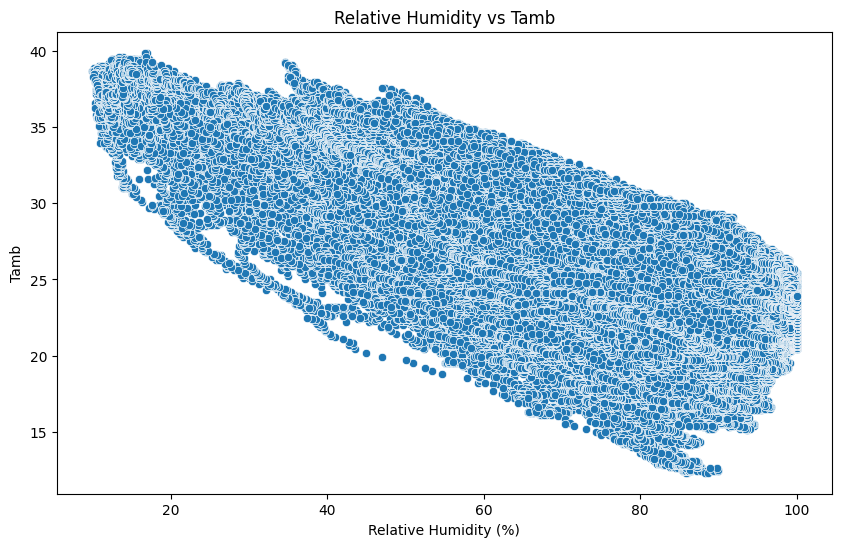

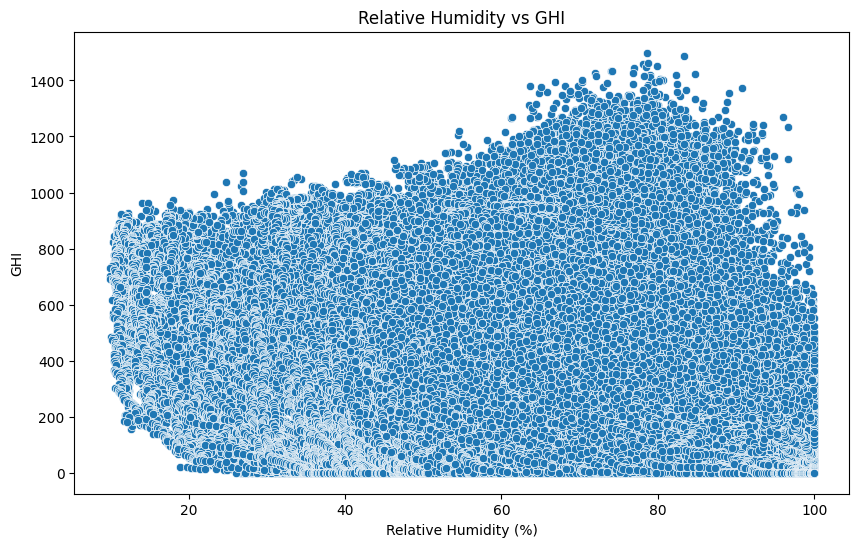

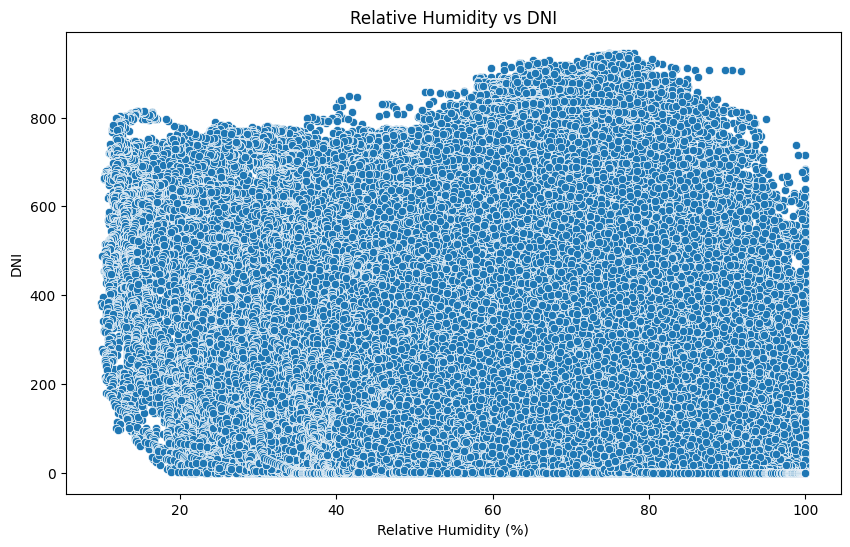

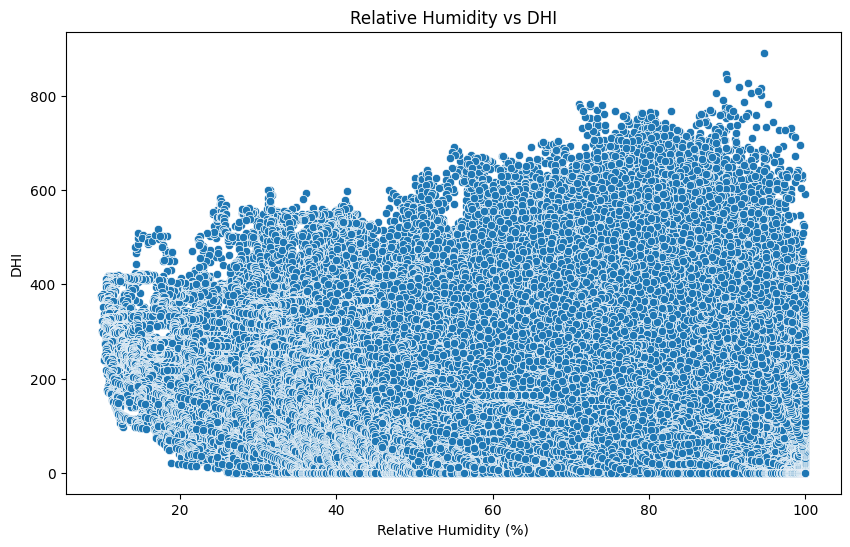

In [31]:
from scripts.temprature_analysis import plot_rh_vs_variables,linear_regression_rh_vs_variable
plot_rh_vs_variables(clean_data,rh_col='RH', variables=['Tamb', 'GHI', 'DNI', 'DHI'])

> * Regression Analysis: Fit a regression model to understand how RH influences temperature and solar radiation.

In [32]:
model, coef = linear_regression_rh_vs_variable(clean_data, rh_col='RH', target_col='Tamb')

Coefficient for RH vs Tamb: -0.16975073316025338


> **Coefficient for RH vs Temperature: -0.170**
* For every 1% increase in relative humidity, the temperature decreases by approximately 0.0170°C. This negative relationship suggests that higher humidity levels are associated with slightly lower temperatures.

In [33]:
model, coef = linear_regression_rh_vs_variable(clean_data, rh_col='RH', target_col='GHI')

Coefficient for RH vs GHI: -7.945778554334382


> **Coefficient for RH vs GHI: -7.946**
* For every 1% increase in relative humidity, the Global Horizontal Irradiance (GHI) decreases by about 7.946 W/m². This suggests a relatively strong negative correlation, meaning higher humidity tends to reduce the amount of solar radiation received on a horizontal surface.

In [34]:
model, coef = linear_regression_rh_vs_variable(clean_data, rh_col='RH', target_col='DNI')

Coefficient for RH vs DNI: -5.846242013417507


> **Coefficient for RH vs DNI: -5.846**
* For every 1% increase in relative humidity, the Direct Normal Irradiance (DNI) decreases by approximately 5.846 W/m². This indicates that higher humidity is associated with a reduction in the direct solar radiation received on a surface perpendicular to the sun's rays.

In [35]:
model, coef = linear_regression_rh_vs_variable(clean_data, rh_col='RH', target_col='DHI')

Coefficient for RH vs DHI: -3.332032597488162


> **Coefficient for RH vs DHI: -3.332**
* For every 1% increase in relative humidity, the Diffuse Horizontal Irradiance (DHI) decreases by about 3.332 W/m². This suggests that higher humidity levels are associated with less diffuse solar radiation on a horizontal surface.

> **General Insights:**
* The negative coefficients across all relationships imply that as relative humidity increases, temperature and solar radiation (GHI, DNI, DHI) tend to decrease.
* This could be due to the fact that higher humidity often corresponds with more cloud cover or moisture in the atmosphere, which can block or scatter solar radiation and contribute to cooler temperatures.
* **For Temperature:** This relationship aligns with the common observation that high humidity often coincides with lower daytime temperatures, especially in regions where cloud cover increases with humidity.
* **For Solar Radiation:** The negative impact of humidity on solar radiation components might be particularly relevant in solar energy studies, as high humidity could reduce the efficiency of solar panels due to less available solar energy.

### **Histogram**

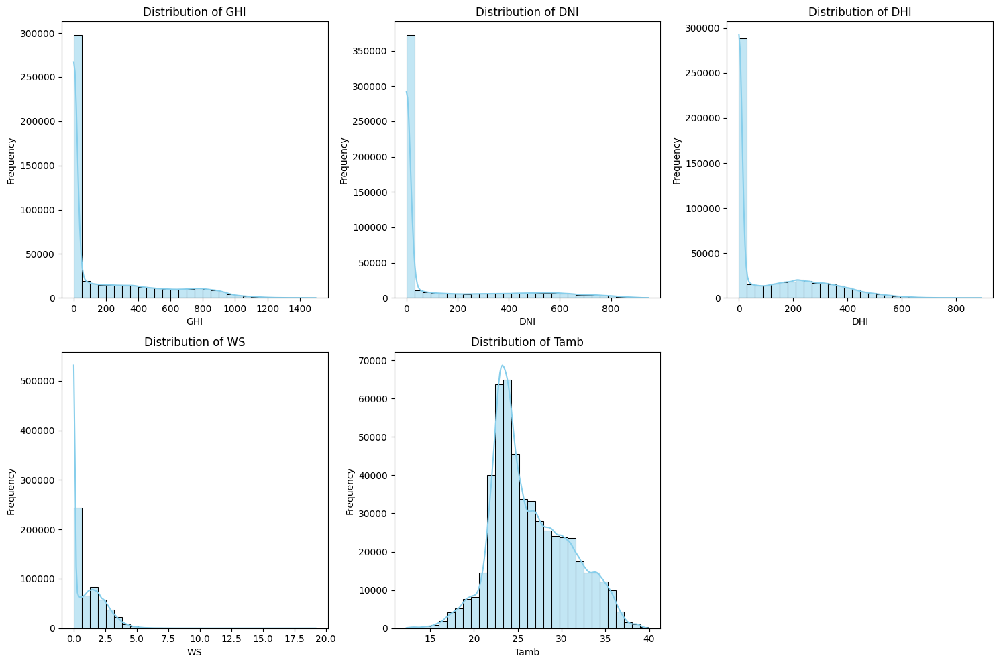

In [36]:
from scripts.histogram import plot_variable_distributions, calculate_z_scores, flag_outliers, plot_timeseries_with_outliers
# List of variables to plot
variables = ['GHI', 'DNI', 'DHI', 'WS', 'Tamb']

plot_variable_distributions(clean_data, variables)


In [37]:
# Calculate Z-scores for the selected columns
z_scores = calculate_z_scores(clean_data[variables])

# Flag data points with Z-scores greater than a threshold (e.g., 3 standard deviations away from the mean)
outliers = flag_outliers(z_scores, threshold=3)

# Display outliers
outlier_indices = outliers.any(axis=1)
outlier_data = clean_data[outlier_indices]

# Print summary of outliers
print(f"Number of outliers detected: {outlier_data.shape[0]}")
print("Outlier data points:")
outlier_data.head()


Number of outliers detected: 15906
Outlier data points:


,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB
Timestamp,,,,,,,,,,,,,,,,,
2021-10-30 10:54:00,814.0,257.0,594.3,878.0,856.0,25.9,85.3,0.5,1.1,0.5,81.4,7.9,1002,0,0.0,50.4,45.6
2021-10-30 10:55:00,826.0,263.5,599.6,883.0,861.0,26.0,85.4,1.7,2.4,0.4,74.6,12.1,1002,0,0.0,51.6,46.6
2021-10-30 10:56:00,851.0,285.0,605.9,912.0,890.0,26.0,84.2,1.6,2.1,0.5,66.4,14.6,1002,0,0.0,52.4,47.0
2021-10-30 10:57:00,823.0,254.8,603.9,878.0,856.0,26.0,85.3,0.8,1.6,0.6,90.2,7.0,1002,0,0.0,53.4,47.7
2021-10-30 10:58:00,810.0,244.5,598.8,864.0,843.0,26.1,85.7,0.6,1.6,0.6,108.5,7.9,1002,0,0.0,54.6,48.6


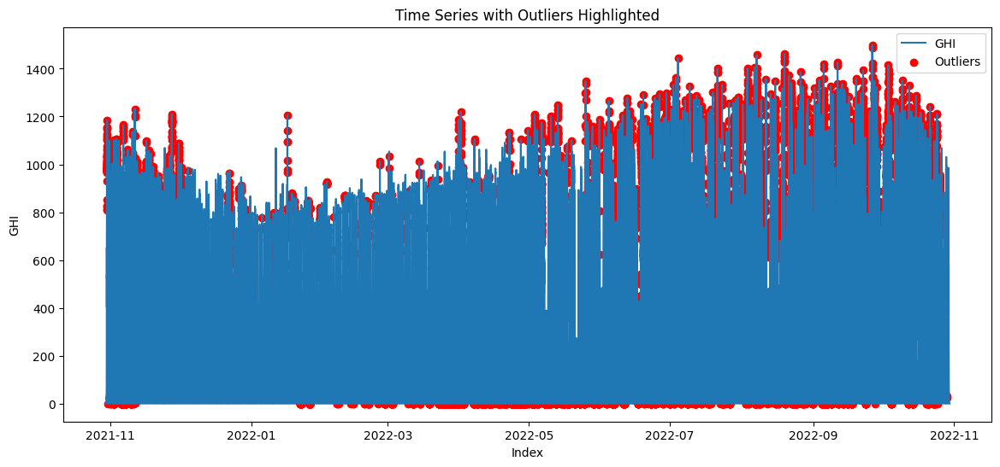

In [38]:
plot_timeseries_with_outliers(clean_data, column='GHI', outlier_data=outlier_data)


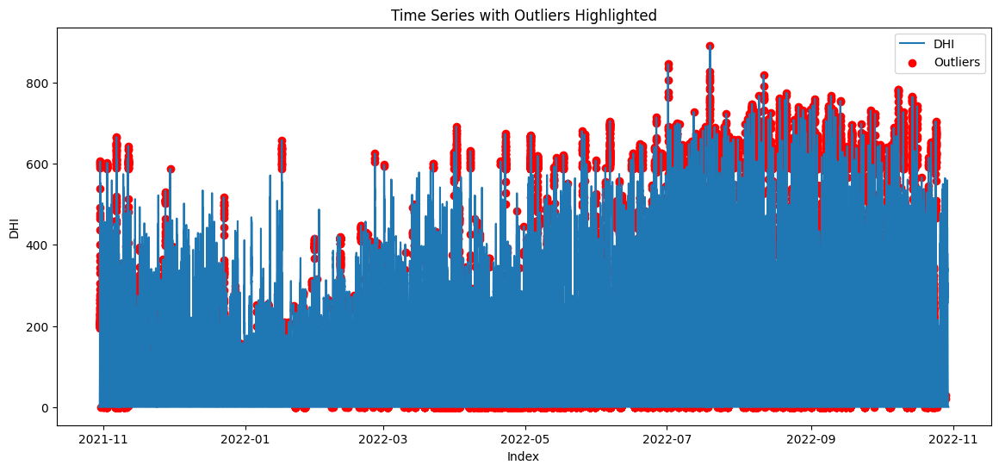

In [39]:
plot_timeseries_with_outliers(clean_data, column='DHI', outlier_data=outlier_data)


In [40]:
# Flag data points with a Z-score greater than 3.5 (adjusted threshold)
outliers_adjusted = flag_outliers(z_scores, threshold=3.5)

# Count the number of outliers detected with the adjusted threshold
outlier_indices_adjusted = outliers_adjusted.any(axis=1)
outlier_data_adjusted = clean_data[outlier_indices_adjusted]

print(f"Number of outliers detected with adjusted threshold: {outlier_data_adjusted.shape[0]}")
outlier_data_adjusted.head()

Number of outliers detected with adjusted threshold: 3448


,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB
Timestamp,,,,,,,,,,,,,,,,,
2021-10-31 17:36:00,35.2,3.6,34.3,35.1,33.1,31.2,66.8,7.5,9.7,1.3,138.2,27.2,999,0,0.0,37.6,39.0
2021-10-31 17:37:00,28.9,0.3,29.0,30.8,29.0,30.9,66.7,6.2,7.9,0.9,111.9,15.5,999,0,0.0,36.4,37.4
2021-10-31 17:42:00,24.0,0.0,25.5,34.4,33.1,29.1,67.3,5.5,7.7,1.4,88.1,23.6,999,0,0.0,31.7,31.8
2021-10-31 17:43:00,23.0,0.0,25.3,35.3,34.0,28.7,73.2,6.9,9.2,1.7,115.3,15.0,999,0,0.4,30.5,30.3
2021-10-31 17:44:00,22.6,0.0,24.5,32.8,31.6,28.0,77.9,5.5,6.7,0.7,117.7,10.2,999,0,0.3,28.9,28.6


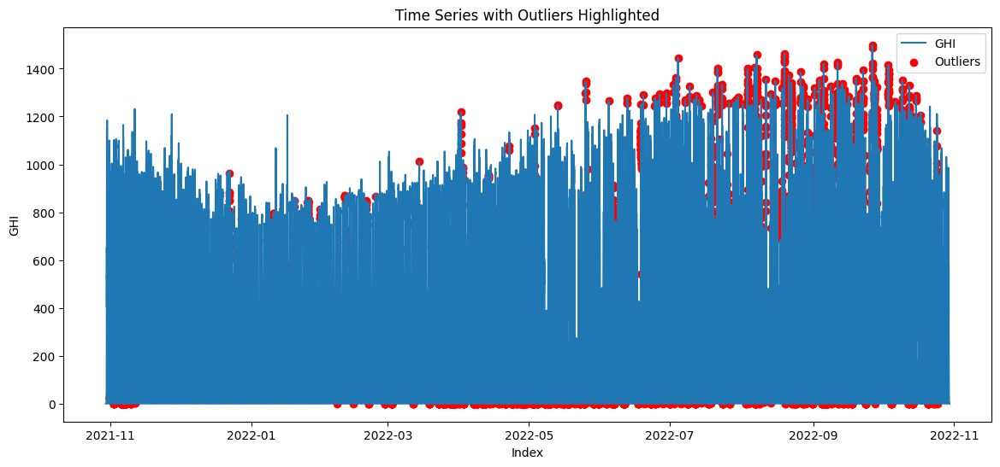

In [41]:
plot_timeseries_with_outliers(clean_data, column='GHI', outlier_data=outlier_data_adjusted)

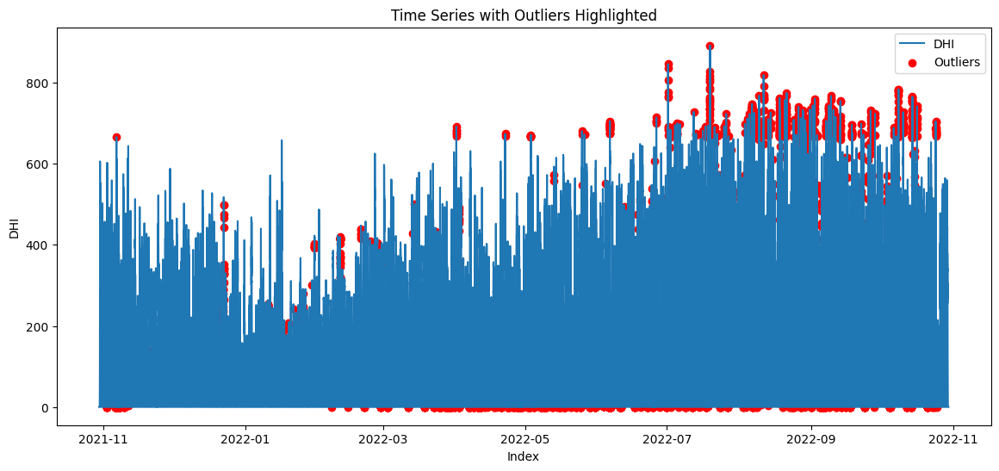

In [42]:
plot_timeseries_with_outliers(clean_data, column='DHI', outlier_data=outlier_data_adjusted)

### **Bubble charts**

* Bubble charts are excellent for visualizing complex relationships between three or more variables. In this case, you can plot GHI vs. Tamb vs. WS, with the bubble size representing an additional variable like RH (Relative Humidity) or BP (Barometric Pressure).

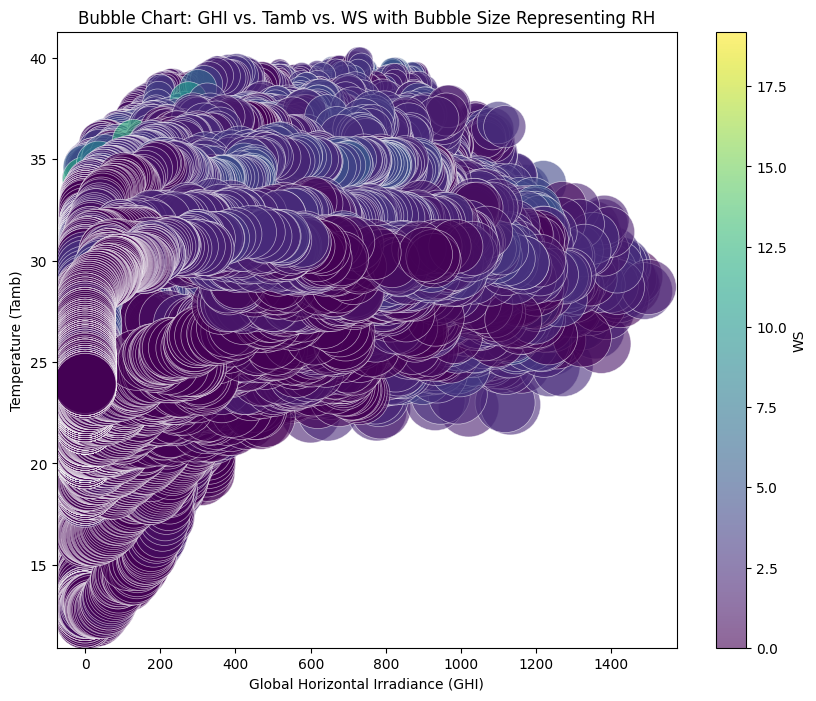

In [43]:
from scripts.bubble import plot_bubble_chart
plot_bubble_chart(clean_data, x_col='GHI', y_col='Tamb', size_col='RH', color_col='WS',cmap='viridis',edgecolors='w',
                  x_label='Global Horizontal Irradiance (GHI)', y_label='Temperature (Tamb)')

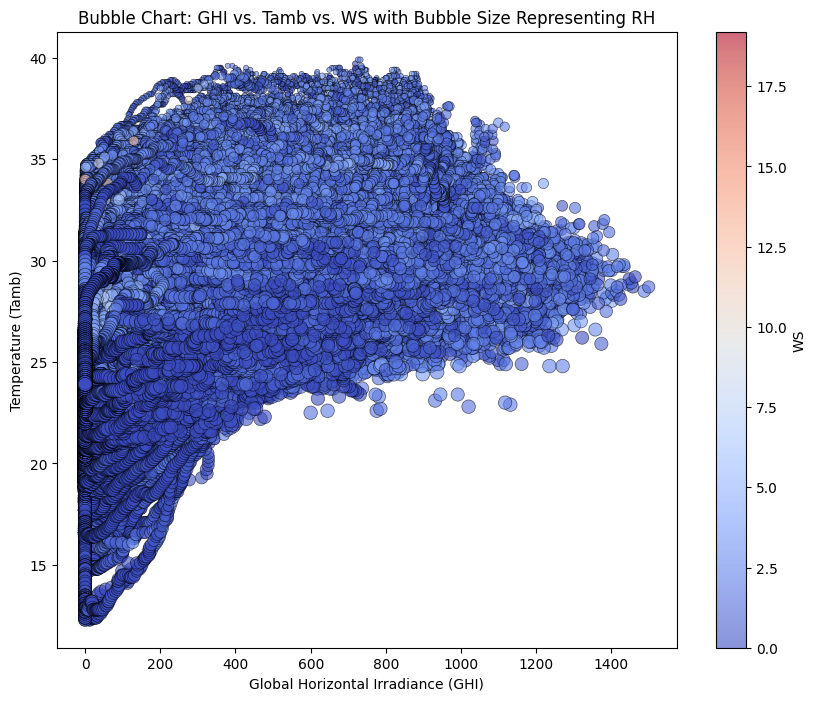

In [44]:
from scripts.bubble import plot_bubble_chart
plot_bubble_chart(clean_data, x_col='GHI', y_col='Tamb', size_col='RH', color_col='WS',cmap='coolwarm',edgecolors='k',scale_factor=1,
                  x_label='Global Horizontal Irradiance (GHI)', y_label='Temperature (Tamb)')